In [24]:
import tensorflow as tf
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import cv2
import matplotlib.pyplot as plt
import random
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import BallTree

#### Model to classify into category

In [11]:
model_category=tf.keras.models.load_model(r"path\model_category.h5")

#### Model to classify into category

In [12]:
model_gender= tf.keras.models.load_model(r"path\my_model_gender.h5")

#### After classification of image , we will need to fetch image from repository of same categories to reccomend 
#### For that we need to fecth image name of predicted category from CSV file

## Read CSV file

In [13]:
df_train = pd.read_csv(r"path\fashion_dataset\train_data.csv",error_bad_lines=False)
df_train['image'] = df_train.apply(lambda row: str(row['id']) + ".jpg", axis=1)
#####
df_test = pd.read_csv(r"path\fashion_dataset\test_data.csv",error_bad_lines=False)
df_test['image'] = df_test.apply(lambda row: str(row['id']) + ".jpg", axis=1)
####
## Combining both data frame
df= pd.concat([df_train, df_test])

C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\3508758967.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df_train = pd.read_csv(r"C:\Users\amitu\Music\fashion_dataset\train_data.csv",error_bad_lines=False)
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\3508758967.py:4: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df_test = pd.read_csv(r"C:\Users\amitu\Music\fashion_dataset\test_data.csv",error_bad_lines=False)


In [14]:
df

,Unnamed: 0,id,articleType,baseColour,gender,price,brandName,image
0,11061,8096,Watches,Brown,Men,2795.0,Fastrack,8096.jpg
1,8856,54650,Watches,Red,Women,1595.0,Fastrack,54650.jpg
2,32117,37301,Watches,Black,Women,3195.0,CASIO,37301.jpg
3,156,32335,Watches,Silver,Men,1325.0,Q&Q,32335.jpg
4,36628,46510,Watches,Black,Men,2645.0,Timex,46510.jpg
...,...,...,...,...,...,...,...,...
4280,4280,51482,Jeans,Blue,Men,1199.0,Denizen,51482.jpg
4281,4281,48393,Jeans,Navy Blue,Men,4299.0,French Connection,48393.jpg
4282,4282,51602,Jeans,Blue,Women,2595.0,Wrangler,51602.jpg
4283,4283,7709,Jeans,Black,Women,1499.0,Jealous 21,7709.jpg


Function to label predicted category 

In [15]:
fashion_items_to_class_indices = {
    "Backpacks": 0,
    "Belts": 1,
    "Flip Flops": 2,
    "Formal Shoes": 3,
    "Handbags": 4,
    "Heels": 5,
    "Jeans": 6,
    "Kurtas": 7,
    "Perfume and Body Mist": 8,
    "Sandals": 9,
    "Shirts": 10,
    "Shoes": 11,
    "Socks": 12,
    "Sunglasses": 13,
    "Tops": 14,
    "Tshirts": 15,
    "Wallets": 16,
    "Watches": 17
}
def find_key_by_value(dictionary, target_value):
    for key, value in dictionary.items():
        if value == target_value:
            return key
    return None

----------------------------------------------------

#### Reading emebeding file

In [16]:
df_emb=pd.read_csv(r"path\imbeded_data_image.csv")

In [17]:
df_emb.head(5)

,Unnamed: 0,id,articleType,gender,e1,e2,e3,e4,e5,e6,...,e9,e10,e11,e12,e13,e14,e15,e16,e17,e18
0,0,8096,Watches,Men,0.000159,1.04E-04,5.53E-05,3.54E-06,7.07E-06,1.81E-05,...,4.22E-04,2.99E-05,1.35E-05,7.59E-05,5.12E-05,2.62E-06,8.35E-06,1.71E-05,9.91E-06,9.99E-01
1,1,54650,Watches,Women,0.000104,6.51E-05,4.05E-05,1.96E-06,2.56E-06,7.69E-06,...,3.02E-04,1.23E-05,4.71E-06,2.63E-05,4.94E-05,1.69E-06,5.48E-06,1.27E-05,5.71E-06,9.99E-01
2,2,37301,Watches,Women,0.000239,2.74E-04,1.45E-04,8.34E-06,1.62E-05,2.79E-05,...,3.18E-04,4.68E-05,2.84E-05,1.32E-04,1.01E-04,4.01E-06,4.39E-05,7.33E-05,2.03E-05,9.98E-01
3,3,32335,Watches,Men,0.000094,8.10E-05,4.92E-05,3.27E-06,4.28E-06,1.05E-05,...,1.15E-04,2.12E-05,5.89E-06,4.73E-05,4.89E-05,1.24E-06,5.21E-06,9.38E-06,7.65E-06,9.99E-01
4,4,46510,Watches,Men,0.000051,5.57E-05,2.10E-05,6.84E-07,1.14E-06,3.27E-06,...,7.92E-05,4.70E-06,3.00E-06,1.03E-05,2.25E-05,8.90E-07,4.16E-06,1.09E-05,1.98E-06,1.00E+00


-----------------------------------------------

#### Step 1 : Create an Embedding matrix using last layer , to find similarity between image & we will reccomendation
####                       top 7 images based on similarity

Getting embedding layer output for each model

In [18]:
# Get the last layer (output layer) of each model
embedding_category_model = tf.keras.models.Model(inputs=model_category.input, outputs=model_category.output)

#### Step 2 : Creating an function which input will be image and it will give images as recoomendation

In [57]:
def recommendation(image_path):
    # Load an image and preprocess it
    image_path = image_path
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (200, 200))
    image = image / 255.0
    image_d=image
    image = np.expand_dims(image, axis=0)
    ###
    # Get the embedding matrix for category prediction (last layer output)
    embedding_category = embedding_category_model.predict(image)
    embedding_category=embedding_category.flatten()
    ### Predict image category and gender
    prediction_category = model_category.predict(image)
    prediction_gender = model_gender.predict(image)
    ### Filter data frame by predicted category and gender
    # Get the predicted class index
    predicted_class_index = np.argmax(prediction_category)
    predicted_category=find_key_by_value(fashion_items_to_class_indices,predicted_class_index)
    ## Label the class
    predicted_class_index = np.argmax(prediction_gender)
    if predicted_class_index == 0:
        predicted_gender='Men'
    else:
        predicted_gender='Women'
    # Get the predicted class index
    predicted_class_index = np.argmax(prediction_category)
    predicted_category=find_key_by_value(fashion_items_to_class_indices,predicted_class_index)
    # Filter images that belong to the predicted categories
    filtered_df = df_emb[
    (df_emb["articleType"] == str(predicted_category)) &
    (df_emb["gender"] == str(predicted_gender))]
    
    #######
    filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
    filtered_df.dropna(inplace=True)
    ######
    
    # Reshape the input embedding_category to a 2D array
    embedding_category_2d = embedding_category.reshape(1, -1)
    # `filtered_df` contains the filtered DataFrame
    # Compute similarity scores between the input image embedding and all products in `filtered_df`
    similarity_scores = cosine_similarity(embedding_category_2d, filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']])
    # Number of recommendations you want
    num_recommendations = 7
    # Get the indices of the top N most similar products
    top_indices = similarity_scores.argsort()[0][-num_recommendations:][::-1]
    # Get the corresponding product IDs from `filtered_df`
    recommended_ids = filtered_df.iloc[top_indices]['id'].tolist()

    print(" input image")
    # Display the image
    plt.imshow(image_d)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()
    import os
    recommended_image_folder = r"path\combined data"
    # Create a subplot for each recommended image
    fig, axs = plt.subplots(1, num_recommendations, figsize=(20,20))
    for i, product_id in enumerate(recommended_ids):
        image_path = os.path.join(recommended_image_folder, f"{product_id}.jpg")
        recommended_image = plt.imread(image_path)

        # Display the image on the subplot
        axs[i].imshow(recommended_image)
        axs[i].axis('off')  # Turn off axis labels

    plt.tight_layout()
    plt.show()




#### Dislpay recommendation fro 20 images

1/1 [==============================] - 0s 185ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


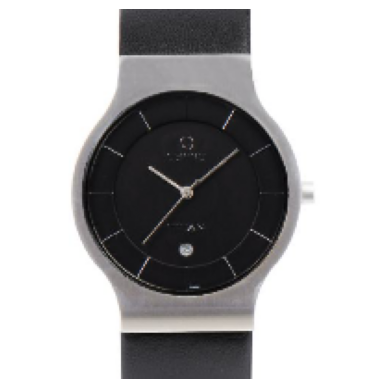

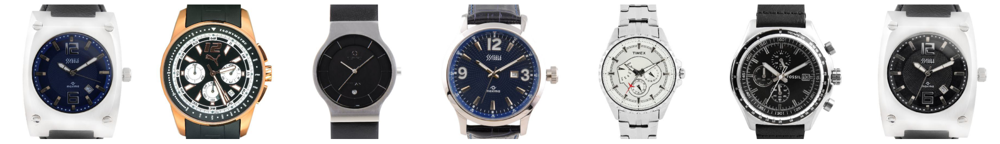

1/1 [==============================] - 0s 115ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


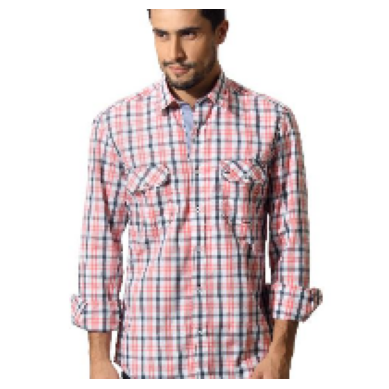

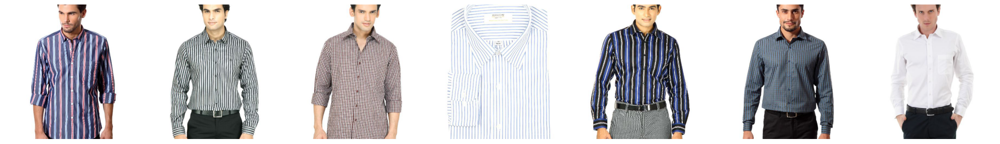

1/1 [==============================] - 0s 145ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


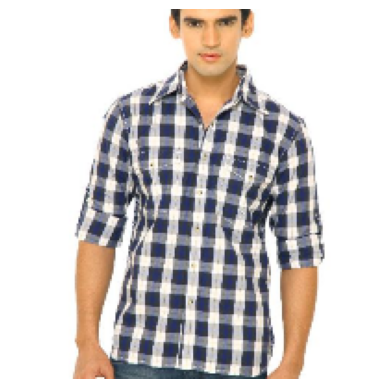

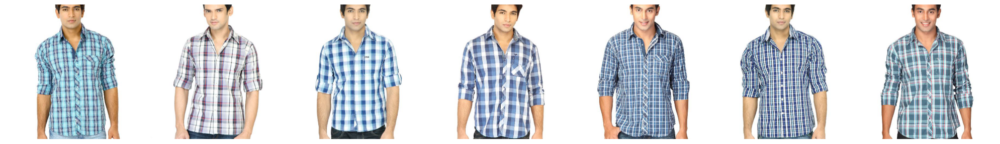

1/1 [==============================] - 0s 189ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


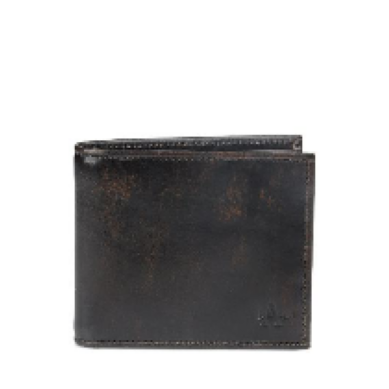

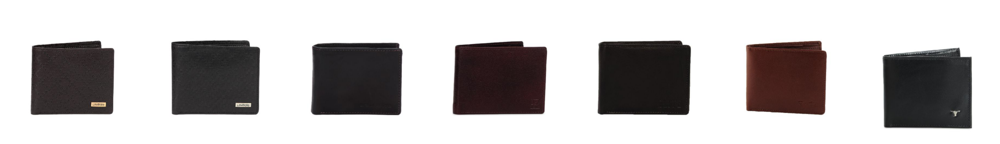

1/1 [==============================] - 0s 114ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


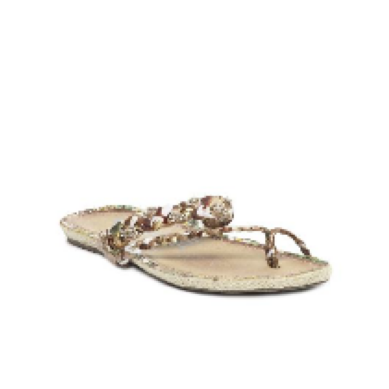

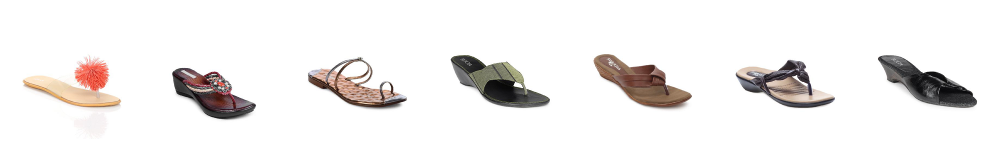

1/1 [==============================] - 0s 129ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


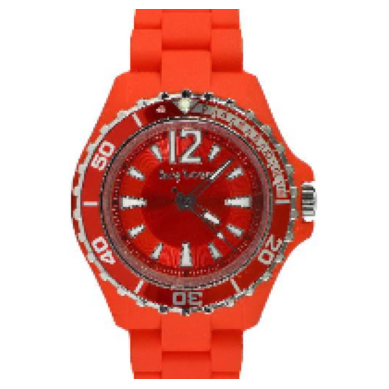

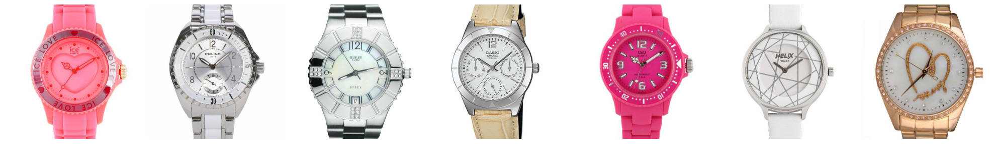

1/1 [==============================] - 0s 133ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


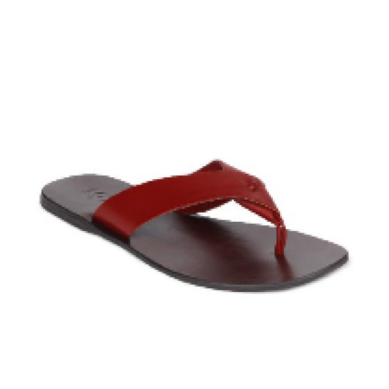

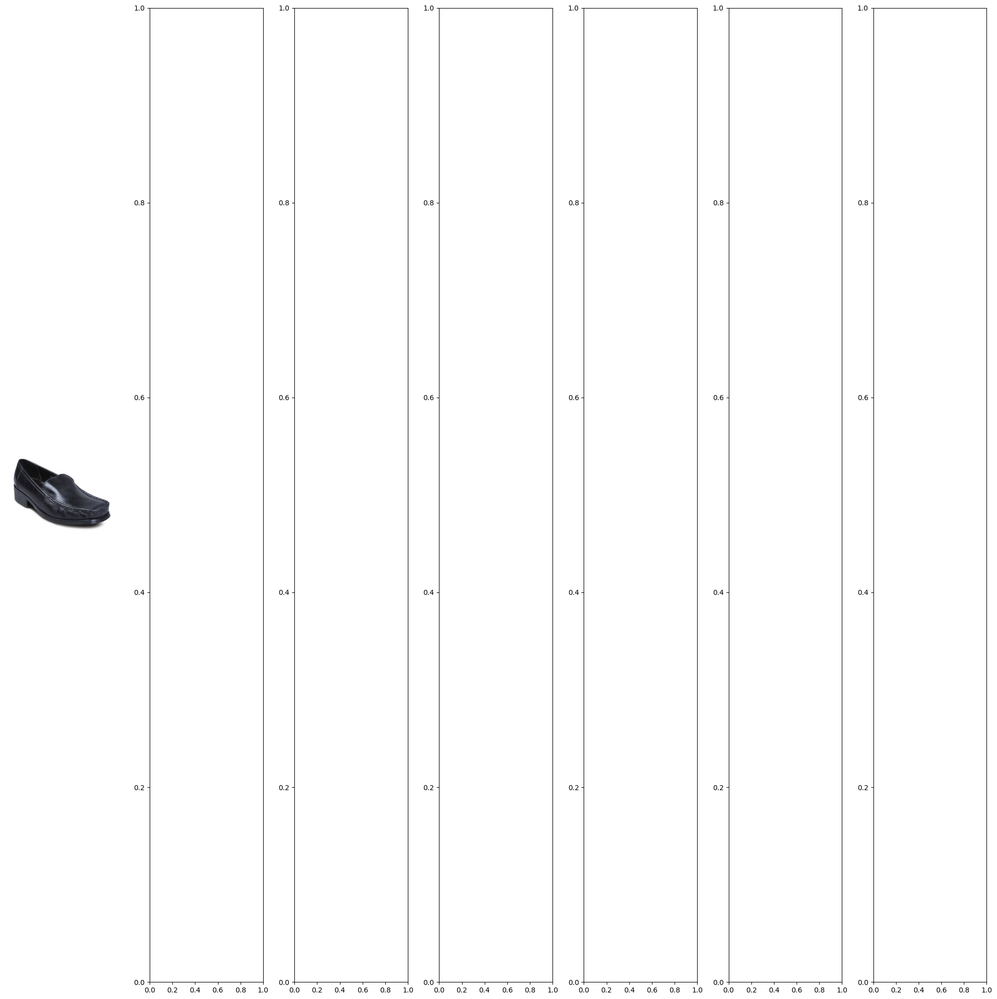

1/1 [==============================] - 0s 198ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


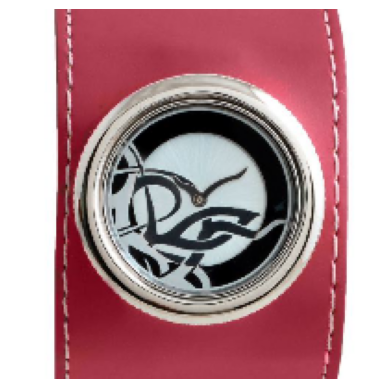

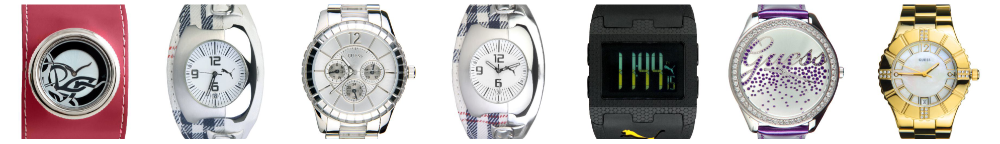

1/1 [==============================] - 0s 150ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


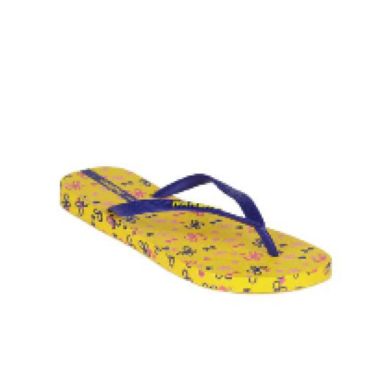

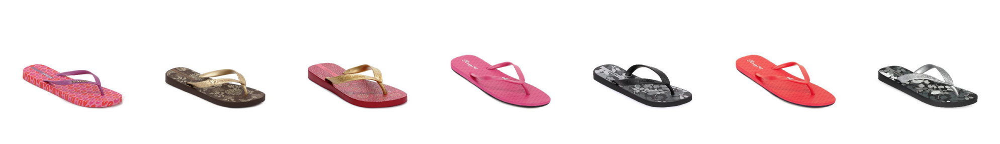

1/1 [==============================] - 0s 195ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


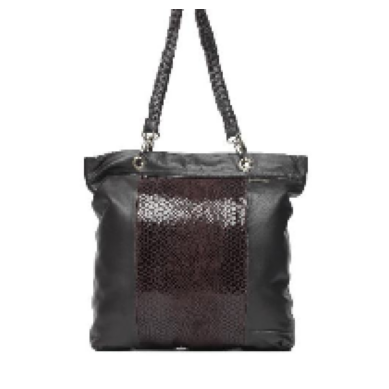

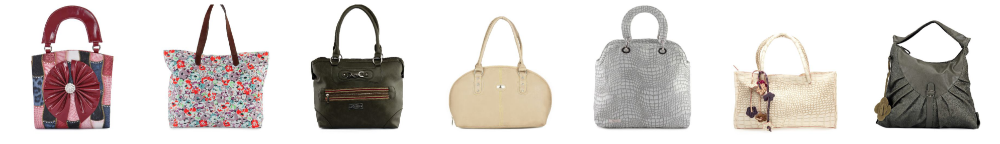

1/1 [==============================] - 0s 218ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


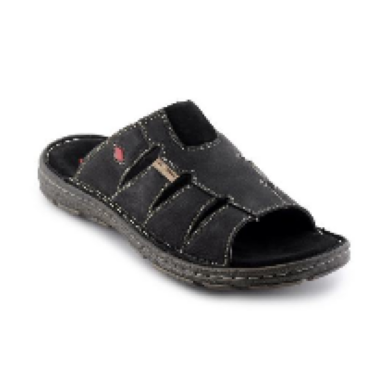

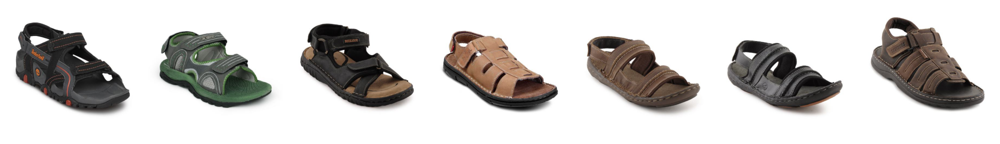

1/1 [==============================] - 0s 123ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


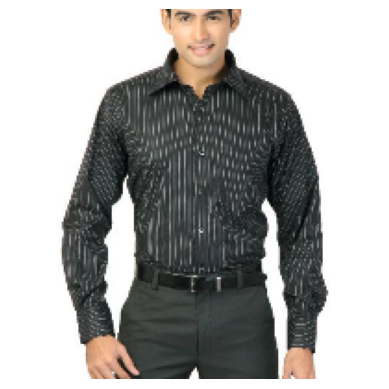

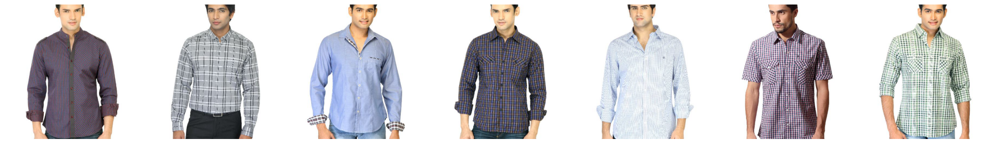

1/1 [==============================] - 0s 108ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


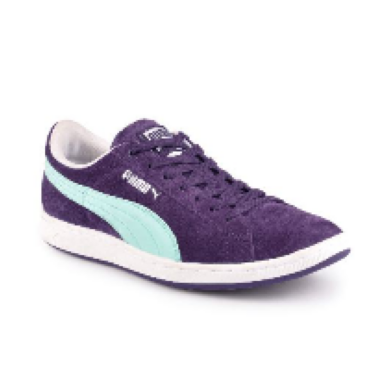

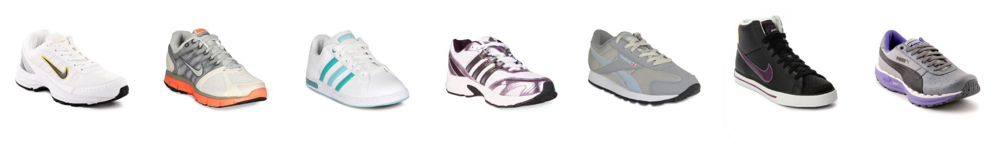

1/1 [==============================] - 0s 107ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


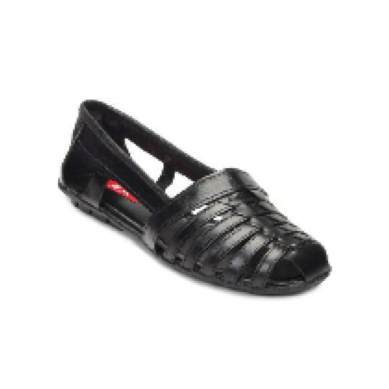

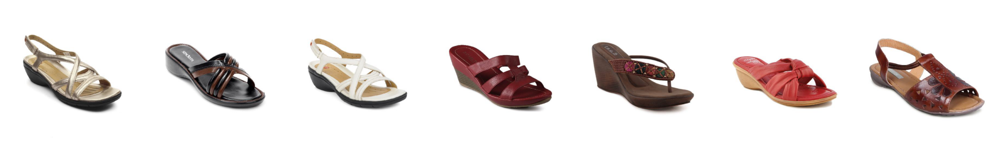

1/1 [==============================] - 0s 206ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


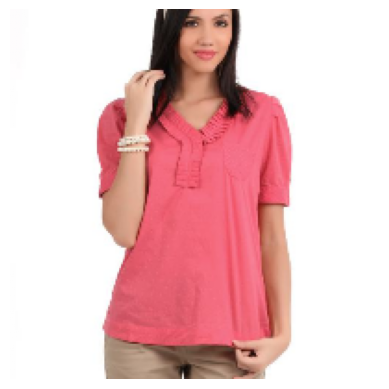

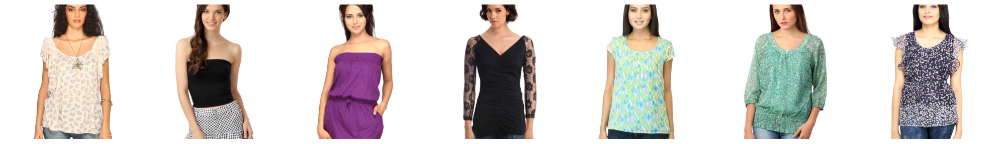

1/1 [==============================] - 0s 120ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


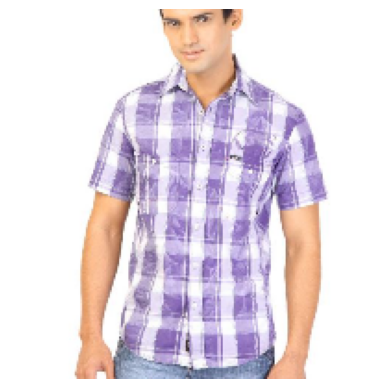

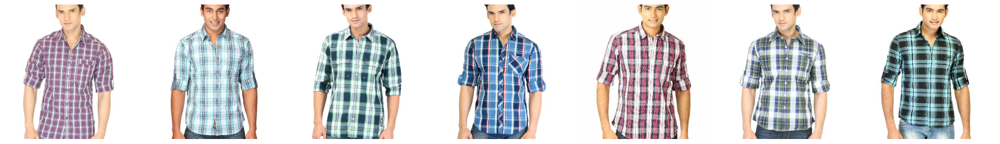

1/1 [==============================] - 0s 201ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


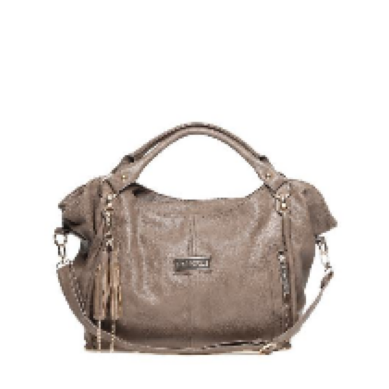

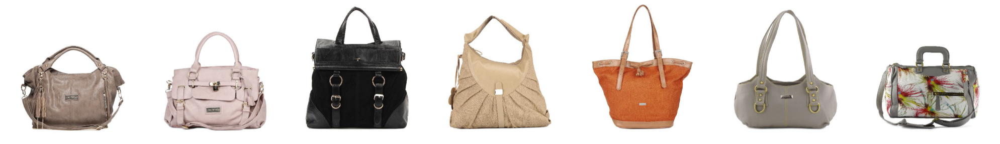

1/1 [==============================] - 0s 211ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


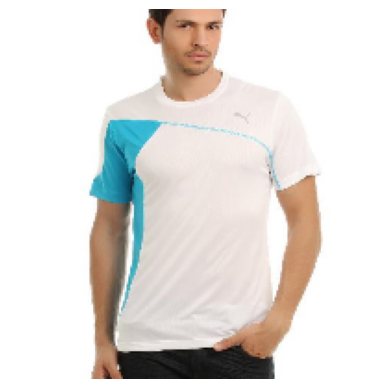

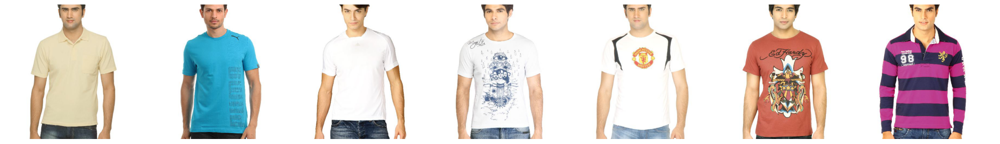

1/1 [==============================] - 0s 120ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


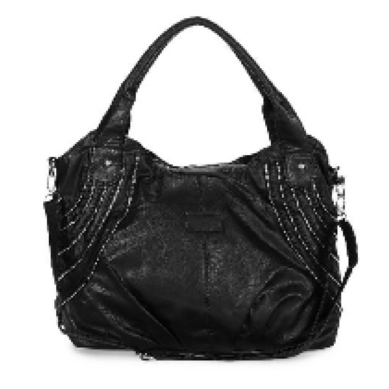

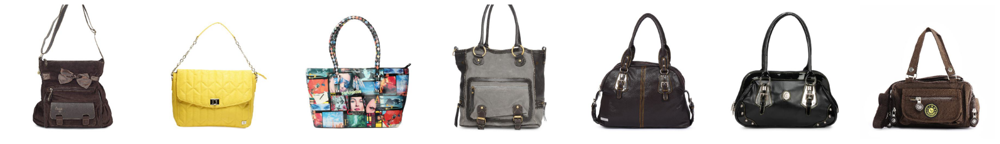

1/1 [==============================] - 0s 161ms/step
 input image


C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']] = filtered_df[['e1', 'e2', 'e3', 'e4', 'e5', 'e6', 'e7', 'e8', 'e9', 'e10', 'e11', 'e12', 'e13', 'e14', 'e15', 'e16', 'e17', 'e18']].apply(pd.to_numeric, errors='coerce')
C:\Users\amitu\AppData\Local\Temp\ipykernel_5424\2535182835.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


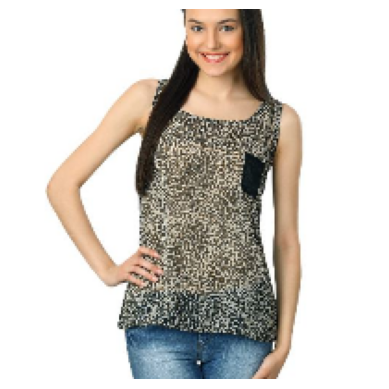

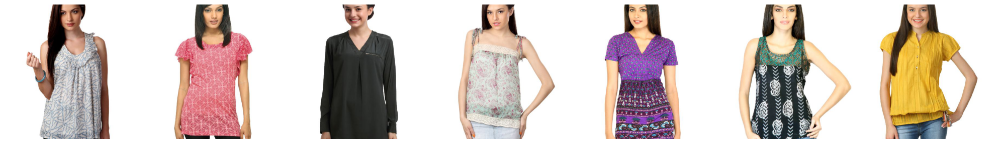

In [58]:
image_directory= r"path\combined data"
image_filenames = os.listdir(image_directory)
for i in range(20):
        random_number = random.randint(1, 20000)
        chosen_image_filename = image_filenames[random_number]
        image_path = os.path.join(image_directory, chosen_image_filename)
        recommendation(image_path)